## Research Planing 3

In [1]:
import pandas as pd

data = pd.read_excel('archive/Supplementary data 1.xlsx')
data

,SUBJECT_ID,AFP,AG,Age,ALB,ALP,ALT,AST,BASO#,BASO%,...,NEU,PCT,PDW,PHOS,PLT,RBC,RDW,TBIL,TP,UA
0,1,3.58\t,19.36,47,45.4,56.0,11.0,24.0,0.01,0.30,...,76.2,0.09,13.4,1.46,74,2.64,13.7,5.5,73.9,396.4
1,2,34.24\t,23.98,61,39.9,95.0,9.0,13.0,0.02,0.30,...,76.5,0.30,11.2,1.09,304,4.89,12.7,6.8,72.0,119.2
2,3,1.50\t,18.40,39,45.4,77.0,9.0,18.0,0.03,0.60,...,69.7,0.13,15.2,0.97,112,4.62,12.0,14.8,77.9,209.2
3,4,2.75,16.60,45,39.2,26.0,16.0,17.0,0.05,0.74,...,65.5,0.25,17.4,1.25,339,4.01,14.6,10.9,66.1,215.6
4,5,2.36,19.97,45,35.0,47.0,21.0,27.0,0.01,0.10,...,59.5,0.28,11.9,0.94,272,4.40,13.4,5.3,66.5,206.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,410,2.09,20.91,52,48.6,65.0,40.0,30.0,0.00,0.00,...,NaN,0.22,10.8,0.99,219,4.56,11.9,10.7,80.4,241.5
345,411,2,12.14,37,46.1,49.0,9.0,20.0,0.00,0.00,...,NaN,0.31,17.3,0.95,262,4.24,17.7,17.2,73.5,240.5
346,412,2.83,19.23,59,45.8,83.0,9.0,16.0,0.02,0.60,...,NaN,0.21,10.4,1.00,221,4.89,11.6,13.8,68.4,209.5
347,413,1.84,27.22,30,47.8,64.0,26.0,22.0,0.03,0.30,...,NaN,0.42,13.4,1.31,398,5.35,12.5,11.3,76.0,285.7


### Missing Value Handle

In [2]:
## check missiing value
data.isnull().sum()

SUBJECT_ID      0
AFP            22
AG              1
Age             0
ALB            10
ALP            10
ALT            10
AST            10
BASO#           0
BASO%           0
BUN             0
Ca              0
CA125          17
CA19-9         24
CA72-4        240
CEA            22
CL              0
CO2CP           1
CREA            0
TYPE            0
DBIL           10
EO#             0
EO%             0
GGT            10
GLO            10
GLU.            0
HCT             0
HE4            20
HGB             0
IBIL           10
K               0
LYM#            0
LYM%            0
MCH             0
MCV             0
Menopause       0
Mg              0
MONO#           0
MONO%           0
MPV             2
Na              0
NEU            91
PCT             2
PDW             2
PHOS            0
PLT             0
RBC             0
RDW             0
TBIL           10
TP             10
UA              0
dtype: int64

In [3]:
## Handle Null-Value : 
# This column data type is object and here instance 22 so, 
ObjectColumnName = ['AFP','AG', 'Age','CA125','CA19-9']

def ObjectNullValueRecover(columnName):
    for cn in columnName:
            data[cn] = data[cn].astype(str).str.replace('\t', '', regex=False)
            data[cn] = pd.to_numeric(data[cn],errors='coerce')
            data[cn] = data[cn].fillna(data[cn].mean())

ObjectNullValueRecover(ObjectColumnName)



# Neumecial Column Remove Null Value, 
neumerical_Column = ['AG', 'ALB','ALP','ALT','AST','CEA','CO2CP','DBIL','GGT','GLO','HE4','IBIL','MPV','NEU','TBIL','TP','PCT','PDW']

def nullValueRecover_Neumeric(columnName):
    for cn in columnName:
        data[cn] = data[cn].fillna(data[cn].mean())


nullValueRecover_Neumeric(neumerical_Column)


# Drop Column 
data = data.drop(columns=['CA72-4']) # 240 null values found!



# check again null-value
data.isnull().sum()


SUBJECT_ID    0
AFP           0
AG            0
Age           0
ALB           0
ALP           0
ALT           0
AST           0
BASO#         0
BASO%         0
BUN           0
Ca            0
CA125         0
CA19-9        0
CEA           0
CL            0
CO2CP         0
CREA          0
TYPE          0
DBIL          0
EO#           0
EO%           0
GGT           0
GLO           0
GLU.          0
HCT           0
HE4           0
HGB           0
IBIL          0
K             0
LYM#          0
LYM%          0
MCH           0
MCV           0
Menopause     0
Mg            0
MONO#         0
MONO%         0
MPV           0
Na            0
NEU           0
PCT           0
PDW           0
PHOS          0
PLT           0
RBC           0
RDW           0
TBIL          0
TP            0
UA            0
dtype: int64

In [4]:
data = data.drop(columns='SUBJECT_ID')

### Outliers Handle

Outliers found in column: AG
Outliers found in column: ALB
Outliers found in column: ALP
Outliers found in column: ALT
Outliers found in column: AST
Outliers found in column: CEA
Outliers found in column: CO2CP
Outliers found in column: DBIL
Outliers found in column: GGT
Outliers found in column: GLO
Outliers found in column: HE4
Outliers found in column: IBIL
Outliers found in column: MPV
Outliers found in column: NEU
Outliers found in column: TBIL
Outliers found in column: TP
Outliers found in column: PCT


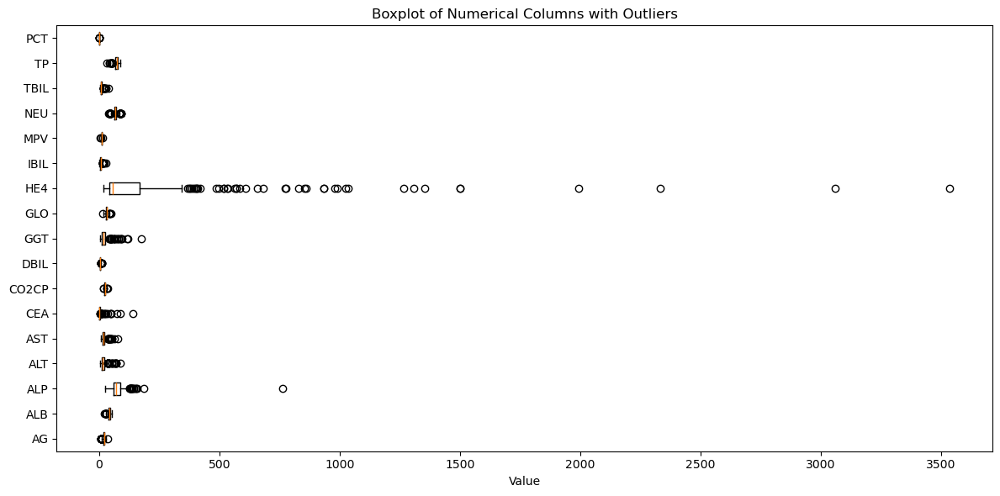

In [5]:
## Check for Outliers

from seaborn import boxplot
from matplotlib import pyplot as plt
import numpy as np

# Check for outliers in all numerical columns and plot boxplots
outlier_columns = []
for col in neumerical_Column:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower) | (data[col] > upper)][col]
    if not outliers.empty:
        outlier_columns.append(col)
        print(f"Outliers found in column: {col}")

if outlier_columns:
    plt.figure(figsize=(12, 6))
    plt.boxplot([data[col] for col in outlier_columns], labels=outlier_columns, vert=False)
    plt.title("Boxplot of Numerical Columns with Outliers")
    plt.xlabel("Value")
    plt.tight_layout()
    plt.show()
else:
    print("No outlier values found in the specified numerical columns.")


No outliers found in column: AG
No outliers found in column: ALB
No outliers found in column: ALP
No outliers found in column: ALT
No outliers found in column: AST
No outliers found in column: CEA
No outliers found in column: CO2CP
No outliers found in column: DBIL
No outliers found in column: GGT
No outliers found in column: GLO
No outliers found in column: HE4
No outliers found in column: IBIL
No outliers found in column: MPV
No outliers found in column: NEU
No outliers found in column: TBIL
No outliers found in column: TP
No outliers found in column: PCT


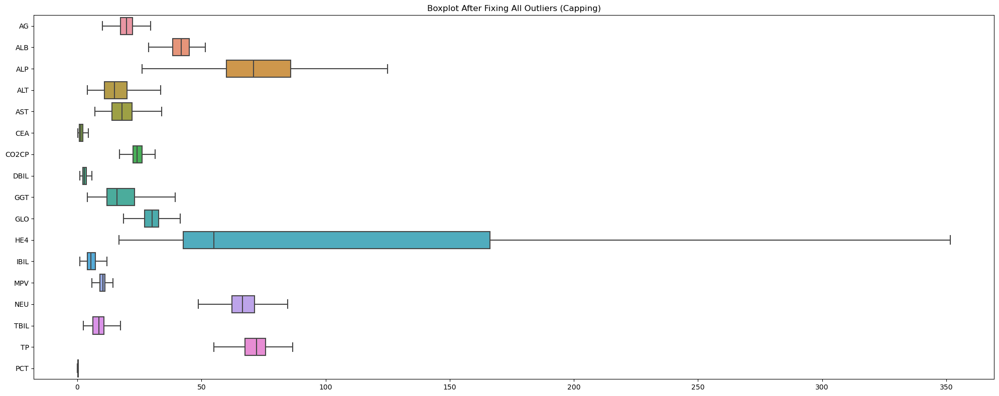

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Cap outliers instead of removing them
def cap_outliers(df, columns):
    df_capped = df.copy()
    for col in columns:
        Q1 = df_capped[col].quantile(0.25)
        Q3 = df_capped[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df_capped[col] = df_capped[col].clip(lower_bound, upper_bound)
    return df_capped

# Apply capping method
data_capped = cap_outliers(data, outlier_columns)

# Check if outliers still exist
for col in outlier_columns:
    Q1 = data_capped[col].quantile(0.25)
    Q3 = data_capped[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data_capped[(data_capped[col] < lower) | (data_capped[col] > upper)][col]
    if not outliers.empty:
        print(f"Outliers still found in column: {col}")
    else:
        print(f"No outliers found in column: {col}")

# Visualize with boxplot
plt.figure(figsize=(20, 8))
sns.boxplot(data=data_capped[outlier_columns], orient='h')
plt.title("Boxplot After Fixing All Outliers (Capping)")
plt.tight_layout()
plt.show()


In [7]:
data_cleaned = data_capped
data_cleaned.shape

(349, 49)

### 4. Test (Shapiro, z-test, chi-square)

#### Shapiro-Wilk Test

In [8]:
## Shapiro-Wilk Test

from scipy.stats import shapiro
import numpy as np

thesordValue = 0.05

stat, p = shapiro(data_cleaned)
print("Shapiro-Wilk Test Statistic:", stat)
print("p-value:", p)

if p > thesordValue:
    print("Data looks normal")
else:
    print("Data is not normal")


Shapiro-Wilk Test Statistic: 0.2717733383178711
p-value: 0.0
Data is not normal


/opt/anaconda3/lib/python3.11/site-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### Z-Test
     -> Positive z ⇒ sample mean > H0_MEAN.
     -> Negative z ⇒ sample mean < H0_MEAN.

In [10]:
## Z-Test

import numpy as np
import pandas as pd
from statsmodels.stats.weightstats import ztest
from statsmodels.stats.multitest import multipletests


H0_MEAN = data_cleaned.values.mean()       
ALPHA   = 0.05


num_cols = data_cleaned.select_dtypes(include=[np.number]).columns.tolist()
rows = []
for col in num_cols:
    x = data_cleaned[col].dropna().to_numpy()
    if x.size < 2:         
        continue
    z, p = ztest(x, value=H0_MEAN)          
    rows.append([col, x.size, x.mean(), x.std(ddof=1), z, p])

res = pd.DataFrame(rows, columns=["variable","n","mean","sd","z","p"])


rej, p_fdr, _, _ = multipletests(res["p"], alpha=ALPHA, method="fdr_bh")
res["p_fdr"] = p_fdr
res["significant(FDR 5%)"] = rej


print(res.sort_values("p_fdr").head(20))

 


     variable    n        mean         sd             z    p  p_fdr  \
24        HCT  349    0.383874   0.042177 -18523.781682  0.0    0.0   
26        HGB  349  125.336103  15.534192     99.974177  0.0    0.0   
27       IBIL  349    5.832409   2.394524   -283.770518  0.0    0.0   
28          K  349    4.386447   0.396798  -1780.525383  0.0    0.0   
29       LYM#  349    1.557593   0.561449  -1352.491650  0.0    0.0   
31        MCH  349   28.777192   2.569315    -97.633541  0.0    0.0   
32        MCV  349   88.070201   6.041754    141.818675  0.0    0.0   
33  Menopause  349    0.340974   0.474717  -1647.472483  0.0    0.0   
34         Mg  349    0.982693   0.123643  -6228.386397  0.0    0.0   
35      MONO#  349    0.355158   0.150504  -5194.667363  0.0    0.0   
47         TP  349   71.338790   6.420982     84.763503  0.0    0.0   
36      MONO%  349    5.579083   1.924260   -355.579722  0.0    0.0   
38         Na  349  140.494842   2.860347    641.952501  0.0    0.0   
39    

#### Chi-Square

In [11]:
## Chi-Square Test

import pandas as pd
from scipy.stats import chi2_contingency


target_col = data_cleaned['TYPE'].replace({0: "Normal", 1: "Cancer"})
target_col = target_col.astype('category')


feature_cols = data_cleaned.drop(columns=['TYPE']).columns


significant  = 0
significant_col_name = []
No_significant = 0

for feature in feature_cols:
    feature_data = data_cleaned[feature].astype('category')
    contingency_table = pd.crosstab(feature_data, target_col)

    # Perform Chi-Square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    
    print(f"\nFeature: {feature}")
    print("Chi-Square Statistic:", chi2)
    print("Degrees of Freedom:", dof)
    print("p-value:", p)
    
    if p < 0.05:
        significant +=1
        significant_col_name.append(feature)
        print(f"-> Significant association between {feature} and TYPE")
    else:
        No_significant +=1
        print(f"-> No significant association between {feature} and TYPE")

print(f"  Total Significant Coloumn No : {significant}")
print(f"       Significant Column Name : {significant_col_name}")
print(f"Total No significant Column No : {No_significant}")



Feature: AFP
Chi-Square Statistic: 249.79342296909564
Degrees of Freedom: 227
p-value: 0.14299821293585718
-> No significant association between AFP and TYPE

Feature: AG
Chi-Square Statistic: 297.4498498394035
Degrees of Freedom: 293
p-value: 0.4166743224541126
-> No significant association between AG and TYPE

Feature: Age
Chi-Square Statistic: 127.54943956403892
Degrees of Freedom: 61
p-value: 1.308286378062515e-06
-> Significant association between Age and TYPE

Feature: ALB
Chi-Square Statistic: 189.28812957800244
Degrees of Freedom: 161
p-value: 0.06310775997143132
-> No significant association between ALB and TYPE

Feature: ALP
Chi-Square Statistic: 108.73869748307703
Degrees of Freedom: 83
p-value: 0.03056280961259273
-> Significant association between ALP and TYPE

Feature: ALT
Chi-Square Statistic: 23.31695569459967
Degrees of Freedom: 31
p-value: 0.8373963153864903
-> No significant association between ALT and TYPE

Feature: AST
Chi-Square Statistic: 37.23091141989859
Degre

### 5. Imbalance
       -> SMOTE + TomeLinks

In [12]:
from imblearn.combine import SMOTETomek
from collections import Counter

# Separate features and target
X = data_cleaned.drop('TYPE', axis=1)
y = data_cleaned['TYPE']

print("Original:", Counter(y))  

# Apply SMOTE + Tomek Links
smt = SMOTETomek(random_state=42)
X_balanced, y_balanced = smt.fit_resample(X, y)

print("After SMOTE + TomekLinks:", Counter(y_balanced))  


Original: Counter({1: 178, 0: 171})
After SMOTE + TomekLinks: Counter({0: 169, 1: 169})


### Models

In [13]:
## Fuzzy KNN Model : 

from sklearn.neighbors import KNeighborsClassifier
import numpy as np

class FuzzyKNN(KNeighborsClassifier):
    def __init__(self, n_neighbors=5, fuzzy_m=2, **kwargs):
        super().__init__(n_neighbors=n_neighbors, **kwargs)
        self.fuzzy_m = fuzzy_m

    def predict_fuzzy(self, X):
        neigh_dist, neigh_ind = self.kneighbors(X)
        y_train = self._y
        classes = self.classes_
        proba = np.zeros((X.shape[0], len(classes)))
        for i, (dist, ind) in enumerate(zip(neigh_dist, neigh_ind)):
            weights = 1 / (dist + 1e-8)
            weights = np.power(weights, self.fuzzy_m)
            for idx, c in enumerate(classes):
                proba[i, idx] = np.sum(weights[y_train[ind] == c])
            proba[i] /= np.sum(proba[i])
        return np.argmax(proba, axis=1)

In [15]:
## ROTF Model :

import numpy as np
from sklearn.base import clone
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

class RotationForest:
    def __init__(self, base_estimator=RandomForestClassifier(), n_estimators=10, feature_subset_size=3, random_state=None):
        self.base_estimator = base_estimator
        self.n_estimators = n_estimators
        self.feature_subset_size = feature_subset_size
        self.random_state = np.random.RandomState(random_state)
        self.models = []
        self.rotation_matrices = []

    def _rotate_data(self, X):
        n_features = X.shape[1]
        indices = np.arange(n_features)
        self.random_state.shuffle(indices)
        subsets = [indices[i:i + self.feature_subset_size] for i in range(0, n_features, self.feature_subset_size)]

        X_rotated = np.empty_like(X, dtype=float)
        rotation_matrix = np.zeros((n_features, n_features))

        for subset in subsets:
            pca = PCA()
            X_subset = X[:, subset]
            X_pca = pca.fit_transform(X_subset)
            X_rotated[:, subset] = X_pca
            rotation_matrix[np.ix_(subset, subset)] = pca.components_

        return X_rotated, rotation_matrix

    def fit(self, X, y):
        self.models = []
        self.rotation_matrices = []
        for _ in range(self.n_estimators):
            # Rotation step
            X_rotated, rotation_matrix = self._rotate_data(X)

            # Train model
            model = clone(self.base_estimator)
            model.fit(X_rotated, y)

            self.models.append(model)
            self.rotation_matrices.append(rotation_matrix)

    def predict(self, X):
        predictions = []
        for model, rotation_matrix in zip(self.models, self.rotation_matrices):
            X_rotated = X @ rotation_matrix.T  # apply rotation
            predictions.append(model.predict(X_rotated))
        predictions = np.array(predictions)
        return np.apply_along_axis(lambda x: np.bincount(x).argmax(), axis=0, arr=predictions)



In [16]:
## Fuzzy Random Forest Model

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

class FuzzyRandomForest(RandomForestClassifier):
    def __init__(self, n_estimators=100, 
                 max_depth=None, 
                 min_samples_split=2, 
                 fuzzy_m=2, 
                 random_state=None):
        super().__init__(n_estimators=n_estimators, max_depth=max_depth, min_samples_split=min_samples_split, random_state=random_state)
        self.fuzzy_m = fuzzy_m

    def predict_fuzzy(self, X):
        # Get probabilities from all trees
        all_proba = np.array([tree.predict_proba(X) for tree in self.estimators_])
        # Fuzzy aggregation (generalized mean)
        fuzzy_proba = np.power(np.mean(np.power(all_proba, self.fuzzy_m), axis=0), 1/self.fuzzy_m)
        return np.argmax(fuzzy_proba, axis=1)

## 6. Feature Selection (RFECV)

In [31]:
from sklearn.feature_selection import RFECV
from sklearn.svm import SVR

X_Rfecv, y_Rfecv = X_balanced, y_balanced

estimator = SVR(kernel="linear")
selector = RFECV(estimator, step=1, cv=5)
selector = selector.fit(X_Rfecv, y_Rfecv)

Rfecv_features = X_Rfecv.columns[rfecv.support_].tolist()

print(f"Rfecv_features : {Rfecv_features}")
print(f"Total Features : {len(Rfecv_features)}")

Rfecv_features : ['AFP', 'Age', 'ALB', 'AST', 'Ca', 'CA125', 'CA19-9', 'CEA', 'CL', 'CO2CP', 'CREA', 'EO#', 'EO%', 'GGT', 'GLO', 'HCT', 'HE4', 'HGB', 'LYM%', 'MCH', 'MCV', 'Mg', 'MONO#', 'MPV', 'Na', 'NEU', 'PCT', 'PDW', 'PHOS', 'RDW', 'TP']
Total Features : 31


In [32]:
## Hyperparameter Tuning of SVD with Grid Search

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


X_rfecv_grid = X_balanced[Rfecv_features]
y_rfecv_grid = y_balanced

# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 150, 200, 250, 300],
    'max_depth': [3, 5, 10, 15, 20],
    'min_samples_split': [2, 4, 6, 8, 10]
}

# Setup GridSearchCV
clf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_rfecv_grid, y_rfecv_grid)

n_estimators_svd = grid_search.best_params_['n_estimators']
max_depth_svd = grid_search.best_params_['max_depth']
min_samples_split_svd = grid_search.best_params_['min_samples_split']

print("Best Parameters from Grid Search:")
print(f"n_estimators: {n_estimators_svd}, max_depth: {max_depth_svd}, min_samples_split: {min_samples_split_svd}")
print("Best Accuracy:", grid_search.best_score_)


Best Parameters from Grid Search:
n_estimators: 300, max_depth: 10, min_samples_split: 2
Best Accuracy: 0.9260316066725197


#### Model Building (RFECV Feature)
    -> Fuzzy Knn
    -> ROTF
    -> Fuzzy Random Forest
    -> Extratree Classifier
    -> Gradient boosting
    -> LGBM Classifier
    -> XGB 
    -> catboosting


In [34]:
## Data Spliting: 

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_balanced)

x_rfecv_train, x_rfecv_test, y_rfecv_train, y_rfecv_test = train_test_split(X_Rfecv[Rfecv_features], y_Rfecv, test_size=0.2, random_state=42)

print("Traing x Data Shape: ", x_rfecv_train.shape)
print("Training y Data Shape : ", y_rfecv_train.shape)
print("Testing x Data Shape: ", x_rfecv_test.shape)
print("Testing y Data Shape: ", y_rfecv_test.shape) 

Traing x Data Shape:  (270, 31)
Training y Data Shape :  (270,)
Testing x Data Shape:  (68, 31)
Testing y Data Shape:  (68,)


## Fuzzy KNN

In [36]:
## Fuzzy Knn ::

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

fuzzy_knn = FuzzyKNN(n_neighbors=5, fuzzy_m=2)
fuzzy_knn.fit(x_rfecv_train, y_rfecv_train)
y_fuzzy_knn_pred = fuzzy_knn.predict_fuzzy(x_rfecv_test)

fuzzyKnn_confusion_matrix = confusion_matrix(y_rfecv_test, y_fuzzy_knn_pred)
fuzzyKnn_accuracy = accuracy_score(y_rfecv_test, y_fuzzy_knn_pred)
fuzzyKnn_precision = precision_score(y_rfecv_test, y_fuzzy_knn_pred)
fuzzyKnn_recall = recall_score(y_rfecv_test, y_fuzzy_knn_pred)
fuzzyKnn_f1_score = f1_score(y_rfecv_test, y_fuzzy_knn_pred)

print("FuzzyKNN on RFCEV:")
print(f"Confusion Matrix:\n{fuzzyKnn_confusion_matrix}")
print(f"Accuracy: {fuzzyKnn_accuracy:.4f}")
print(f"Precision: {fuzzyKnn_precision:.4f}")
print(f"Recall: {fuzzyKnn_recall:.4f}")
print(f"F1 Score: {fuzzyKnn_f1_score:.4f}")

FuzzyKNN on RFCEV:
Confusion Matrix:
[[26  9]
 [ 1 32]]
Accuracy: 0.8529
Precision: 0.7805
Recall: 0.9697
F1 Score: 0.8649


#### Model Optimize (HHO)

In [37]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# === HHO Optimizer (reused from your sample) ===
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]

    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])

            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z

            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# === Objective Function for Fuzzy KNN ===
def objective_fuzzy_knn(params):
    n_neighbors = int(round(params[0]))
    fuzzy_m = params[1]

    # Parameter bounds
    n_neighbors = max(1, n_neighbors)
    fuzzy_m = max(1.01, min(fuzzy_m, 5.0))

    # Model training and evaluation
    model = FuzzyKNN(n_neighbors=n_neighbors, fuzzy_m=fuzzy_m)
    model.fit(x_rfecv_train, y_rfecv_train)
    preds = model.predict_fuzzy(x_rfecv_test)

    acc = accuracy_score(y_rfecv_test, preds)
    return -acc  # because we are minimizing

# === HHO Parameters ===
lb = [1, 1.1]   # lower bounds: n_neighbors, fuzzy_m
ub = [15, 4.0]  # upper bounds
dim = 2

# === Run HHO Optimization ===
best_params_fknn, best_score_fknn = HHO(objective_fuzzy_knn, lb, ub, dim=dim, SearchAgents_no=15, Max_iter=30)

# === Train best model ===
opt_n_neighbors = int(round(best_params_fknn[0]))
opt_fuzzy_m = best_params_fknn[1]

best_fuzzy_knn = FuzzyKNN(n_neighbors=opt_n_neighbors, fuzzy_m=opt_fuzzy_m)
best_fuzzy_knn.fit(x_rfecv_train, y_rfecv_train)
y_pred_fknn = best_fuzzy_knn.predict_fuzzy(x_rfecv_test)

# === Evaluation ===
conf_matrix = confusion_matrix(y_rfecv_test, y_pred_fknn)
accuracy = accuracy_score(y_rfecv_test, y_pred_fknn)
precision = precision_score(y_rfecv_test, y_pred_fknn)
recall = recall_score(y_rfecv_test, y_pred_fknn)
f1 = f1_score(y_rfecv_test, y_pred_fknn)

# === Report ===
print("FuzzyKNN (HHO-Optimized) on RFECV Features:")
print(f"Best Params - n_neighbors: {opt_n_neighbors}, fuzzy_m: {opt_fuzzy_m:.4f}")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


FuzzyKNN (HHO-Optimized) on RFECV Features:
Best Params - n_neighbors: 11, fuzzy_m: 3.1685
Confusion Matrix:
[[27  8]
 [ 1 32]]
Accuracy: 0.8676
Precision: 0.8000
Recall: 0.9697
F1 Score: 0.8767


## ROTF

In [41]:
## ROTF ::
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Create and train Rotation Forest model
rotf_model = RotationForest(
    base_estimator=RandomForestClassifier(n_estimators=n_estimators_svd, 
                                          max_depth=max_depth_svd, 
                                          min_samples_split=min_samples_split_svd),
    n_estimators=10,
    feature_subset_size=5,
    random_state=42
)

rotf_model.fit(x_rfecv_train.values, y_rfecv_train.values)
y_pred = rotf_model.predict(x_rfecv_test.values)

# Evaluation
rotf_confusion_matrix = confusion_matrix(y_rfecv_test, y_pred)
rotf_accuracy = accuracy_score(y_rfecv_test, y_pred)
rotf_precision = precision_score(y_rfecv_test, y_pred)
rotf_recall = recall_score(y_rfecv_test, y_pred)
rotf_f1 = f1_score(y_rfecv_test, y_pred)  


print("RoTF applying RFECV:")
print(f"Confusion Matrix:\n{rotf_confusion_matrix}")
print(f"Accuracy: {rotf_accuracy:.4f}")
print(f"Precision: {rotf_precision:.4f}")
print(f"Recall: {rotf_recall:.4f}")
print(f"F1 Score: {rotf_f1:.4f}")


RoTF applying RFECV:
Confusion Matrix:
[[35  0]
 [33  0]]
Accuracy: 0.5147
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Model Optimizer (HHO)

In [45]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier

# Assume your RotationForest class is correctly implemented and already imported

# --- HHO implementation ---
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]
    
    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            
            X_new = np.copy(X[i])
            
            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
            
            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy


# --- Objective Function (RotationForest Accuracy) ---
def objective_function(params):
    n_estimators_svd = int(round(params[0]))
    max_depth_svd = int(round(params[1]))
    min_samples_split_svd = int(round(params[2]))
    
    n_estimators_svd = max(10, n_estimators_svd)
    max_depth_svd = max(1, max_depth_svd)
    min_samples_split_svd = max(2, min_samples_split_svd)
    
    base_rf = RandomForestClassifier(
        n_estimators=n_estimators_svd,
        max_depth=max_depth_svd,
        min_samples_split=min_samples_split_svd,
        random_state=42
    )
    
    rotf_model = RotationForest(
        base_estimator=base_rf,
        n_estimators=10,
        feature_subset_size=5,
        random_state=42
    )

    # ⚠️ Convert to NumPy arrays to avoid slicing error
    rotf_model.fit(x_rfecv_train.values, y_rfecv_train.values)
    y_pred = rotf_model.predict(x_rfecv_test.values)
    
    acc = accuracy_score(y_rfecv_test, y_pred)
    return -acc  # HHO minimizes objective


# --- Hyperparameter Bounds ---
lb = [10, 1, 2]     # Lower bounds: [n_estimators, max_depth, min_samples_split]
ub = [200, 30, 20]  # Upper bounds

# --- Run HHO ---
best_params, best_score = HHO(objective_function, lb, ub, dim=3, SearchAgents_no=20, Max_iter=50)

print("Best hyperparameters found:")
print(f"n_estimators_svd: {int(round(best_params[0]))}")
print(f"max_depth_svd: {int(round(best_params[1]))}")
print(f"min_samples_split_svd: {int(round(best_params[2]))}")
print(f"Best accuracy (val): {-best_score:.4f}")

# --- Final Evaluation on Test Set ---
best_base_rf = RandomForestClassifier(
    n_estimators=int(round(best_params[0])),
    max_depth=int(round(best_params[1])),
    min_samples_split=int(round(best_params[2])),
    random_state=42
)

best_rotf_model = RotationForest(
    base_estimator=best_base_rf,
    n_estimators=10,
    feature_subset_size=5,
    random_state=42
)

# Train and predict
best_rotf_model.fit(x_rfecv_train.values, y_rfecv_train.values)
y_best_pred = best_rotf_model.predict(x_rfecv_test.values)

# --- Metrics ---
print("\nEvaluation on Test Set:")
print("Confusion Matrix:\n", confusion_matrix(y_rfecv_test, y_best_pred))
print(f"Accuracy: {accuracy_score(y_rfecv_test, y_best_pred):.4f}")
print(f"Precision: {precision_score(y_rfecv_test, y_best_pred):.4f}")
print(f"Recall: {recall_score(y_rfecv_test, y_best_pred):.4f}")
print(f"F1 Score: {f1_score(y_rfecv_test, y_best_pred):.4f}")


Best hyperparameters found:
n_estimators_svd: 100
max_depth_svd: 13
min_samples_split_svd: 5
Best accuracy (val): 0.5147

Evaluation on Test Set:
Confusion Matrix:
 [[35  0]
 [33  0]]
Accuracy: 0.5147
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Fuzz Random Forest

In [46]:
## Fuzzy Random Forest Model applying SVD Features:

model = FuzzyRandomForest(n_estimators=n_estimators_svd, 
                          max_depth=max_depth_svd, 
                          min_samples_split=min_samples_split_svd, 
                          fuzzy_m=2, 
                          random_state=42)
model.fit(x_rfecv_train, y_rfecv_train)
y_pred = model.predict_fuzzy(x_rfecv_test)


frf_confusion_matrix = confusion_matrix(y_rfecv_test, y_pred)
frf_accuracy = accuracy_score(y_rfecv_test, y_pred)
frf_precision = precision_score(y_rfecv_test, y_pred, average='binary')
frf_recall = recall_score(y_rfecv_test, y_pred, average='binary')
frf_f1_score = f1_score(y_rfecv_test, y_pred, average='binary')

print("Fuzzy Random Forest Model Performance applying RFECV Feature selection:")
print(f"confusion_matrix :\n {frf_confusion_matrix}")
print(f" Accuracy :{frf_accuracy:.4f}")
print(f"Precision :{frf_precision:.4f}")
print(f"   Recall :{frf_recall:.4f}")
print(f" F1 Score :{frf_f1_score:.4f}")   

Fuzzy Random Forest Model Performance applying RFECV Feature selection:
confusion_matrix :
 [[29  6]
 [ 1 32]]
 Accuracy :0.8971
Precision :0.8421
   Recall :0.9697
 F1 Score :0.9014


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClass

#### Model Optimizer (HHO)

In [47]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.ensemble import ExtraTreesClassifier

# --- Define FuzzyRandomForest class ---
class FuzzyRandomForest:
    def __init__(self, n_estimators=100, max_depth=None, min_samples_split=2, fuzzy_m=2, random_state=None):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.fuzzy_m = fuzzy_m
        self.model = ExtraTreesClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            random_state=random_state
        )

    def fit(self, X, y):
        self.model.fit(X, y)

    def predict_fuzzy(self, X):
        return self.model.predict(X)

# --- HHO Optimizer ---
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]
    
    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])
            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# --- Objective Function for Fuzzy RF ---
def objective_function(params):
    n_estimators = int(round(params[0]))
    max_depth = int(round(params[1]))
    min_samples_split = int(round(params[2]))
    fuzzy_m = int(round(params[3]))
    
    # Safety bounds
    n_estimators = max(10, n_estimators)
    max_depth = max(1, max_depth)
    min_samples_split = max(2, min_samples_split)
    fuzzy_m = max(1, fuzzy_m)

    model = FuzzyRandomForest(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        fuzzy_m=fuzzy_m,
        random_state=42
    )
    model.fit(x_rfecv_train, y_rfecv_train)
    y_pred = model.predict_fuzzy(x_rfecv_test)
    return -accuracy_score(y_rfecv_test, y_pred)

# --- HHO Search Space ---
lb = [10, 1, 2, 1]
ub = [200, 30, 20, 5]

# --- Run Optimization ---
best_params, best_score = HHO(objective_function, lb, ub, dim=4)

# --- Evaluate Final Optimized Model ---
best_model = FuzzyRandomForest(
    n_estimators=int(round(best_params[0])),
    max_depth=int(round(best_params[1])),
    min_samples_split=int(round(best_params[2])),
    fuzzy_m=int(round(best_params[3])),
    random_state=42
)

best_model.fit(x_rfecv_train, y_rfecv_train)
y_pred = best_model.predict_fuzzy(x_rfecv_test)

print("\nBest Hyperparameters (HHO):")
print(f"n_estimators: {int(round(best_params[0]))}")
print(f"max_depth: {int(round(best_params[1]))}")
print(f"min_samples_split: {int(round(best_params[2]))}")
print(f"fuzzy_m: {int(round(best_params[3]))}")

print("\nPerformance on Test Set:")
print(f"Confusion Matrix:\n{confusion_matrix(y_rfecv_test, y_pred)}")
print(f"Accuracy:  {accuracy_score(y_rfecv_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_rfecv_test, y_pred):.4f}")
print(f"Recall:    {recall_score(y_rfecv_test, y_pred):.4f}")
print(f"F1 Score:  {f1_score(y_rfecv_test, y_pred):.4f}")



Best Hyperparameters (HHO):
n_estimators: 32
max_depth: 5
min_samples_split: 11
fuzzy_m: 2

Performance on Test Set:
Confusion Matrix:
[[31  4]
 [ 1 32]]
Accuracy:  0.9265
Precision: 0.8889
Recall:    0.9697
F1 Score:  0.9275


## Extra Tree Classifier

In [48]:
## Extra Trees Classifier on SVD Features : 

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Train ExtraTreesClassifier
et_model = ExtraTreesClassifier(random_state=42,
                                n_estimators=n_estimators_svd,
                                max_depth=max_depth_svd,
                                min_samples_split=min_samples_split_svd)
et_model.fit(x_rfecv_train, y_rfecv_train)


# Predict on test sets
y_test_pred_et = et_model.predict(x_rfecv_test)

et_confusion_matrix = confusion_matrix(y_rfecv_test, y_test_pred_et)
et_accuracy = accuracy_score(y_rfecv_test, y_test_pred_et)
et_precision = precision_score(y_rfecv_test, y_test_pred_et)
et_recall = recall_score(y_rfecv_test, y_test_pred_et)
et_f1_score = f1_score(y_rfecv_test, y_test_pred_et)


# Evaluate on test set
print("ExtraTreesClassifier Performance applying RFECV Features :")
print(f"Confusion Matrix:\n{et_confusion_matrix}")
print(f"Accuracy: {et_accuracy:.4f}")
print(f"Precision: {et_precision:.4f}")     
print(f"Recall: {et_recall:.4f}")
print(f"F1 Score: {et_f1_score:.4f}")


ExtraTreesClassifier Performance applying RFECV Features :
Confusion Matrix:
[[29  6]
 [ 1 32]]
Accuracy: 0.8971
Precision: 0.8421
Recall: 0.9697
F1 Score: 0.9014


#### Model Optimizer (HHO)

In [49]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np


# Define HHO for ExtraTreesClassifier
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]

    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])

            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z

            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# Objective function for ExtraTreesClassifier
def objective_et(params):
    n_estimators_svd = int(round(params[0]))
    max_depth_svd = int(round(params[1]))
    min_samples_split_svd = int(round(params[2]))

    n_estimators_svd = max(10, n_estimators_svd)
    max_depth_svd = max(1, max_depth_svd)
    min_samples_split_svd = max(2, min_samples_split_svd)

    et_model = ExtraTreesClassifier(
        n_estimators=n_estimators_svd,
        max_depth=max_depth_svd,
        min_samples_split=min_samples_split_svd,
        random_state=42
    )
    et_model.fit(x_rfecv_train, y_rfecv_train)
    y_pred = et_model.predict(x_rfecv_test)
    acc = accuracy_score(y_rfecv_test, y_pred)
    return -acc

# Hyperparameter bounds
lb = [10, 1, 2]
ub = [200, 30, 20]

# Run HHO for ExtraTrees
best_params_et, best_score_et = HHO(objective_et, lb, ub, dim=3, SearchAgents_no=15, Max_iter=30)

# Final model
best_et_model = ExtraTreesClassifier(
    n_estimators=int(round(best_params_et[0])),
    max_depth=int(round(best_params_et[1])),
    min_samples_split=int(round(best_params_et[2])),
    random_state=42
)

best_et_model.fit(x_rfecv_train, y_rfecv_train)
y_best_pred_et = best_et_model.predict(x_rfecv_test)

# Performance metrics
conf_matrix = confusion_matrix(y_rfecv_test, y_best_pred_et)
accuracy = accuracy_score(y_rfecv_test, y_best_pred_et)
precision = precision_score(y_rfecv_test, y_best_pred_et)
recall = recall_score(y_rfecv_test, y_best_pred_et)
f1 = f1_score(y_rfecv_test, y_best_pred_et)

print("Model Optimizer (HHO) : Extra Tree Classifier : ")
print(f"confusion_matrix : {conf_matrix}")
print(f"Accuracy : {accuracy:.4f}")
print(f"precision : {precision:.4f}")
print(f"Recall : {recall:.4f}")
print(f"F1-Score : {f1:.4f}")


Model Optimizer (HHO) : Extra Tree Classifier : 
confusion_matrix : [[32  3]
 [ 1 32]]
Accuracy : 0.9412
precision : 0.9143
Recall : 0.9697
F1-Score : 0.9412


## Gradient Boosting 

In [50]:
## Gradient Boosting Classifier on SVD Features

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


gb_model = GradientBoostingClassifier(random_state=42,
                                      n_estimators=n_estimators_svd, 
                                      max_depth=max_depth_svd, 
                                      min_samples_split=min_samples_split_svd)
gb_model.fit(x_rfecv_train, y_rfecv_train)

# Predict on test data
y_gb_pred = gb_model.predict(x_rfecv_test)


# Evaluation on test set
gb_confusion_matrix = confusion_matrix(y_rfecv_test, y_gb_pred)
gb_accuracy = accuracy_score(y_rfecv_test, y_gb_pred)
gb_precision = precision_score(y_rfecv_test, y_gb_pred)
gb_recall = recall_score(y_rfecv_test, y_gb_pred)
gb_f1 = f1_score(y_rfecv_test, y_gb_pred)

print("GradientBoostingClassifie Performance applying Features :")
print(f"Confusion Matrix:\n{gb_confusion_matrix}")
print(f"Accuracy: {gb_accuracy:.4f}")
print(f"Precision: {gb_precision:.4f}")
print(f"Recall: {gb_recall:.4f}")
print(f"F1 Score: {gb_f1:.4f}")

GradientBoostingClassifie Performance applying Features :
Confusion Matrix:
[[29  6]
 [ 2 31]]
Accuracy: 0.8824
Precision: 0.8378
Recall: 0.9394
F1 Score: 0.8857


#### Model Optimizer (HHO)

In [51]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

# HHO optimizer
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]

    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])

            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z

            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# === Objective function for Gradient Boosting Classifier ===
def objective_gb(params):
    n_estimators = int(round(params[0]))
    max_depth = int(round(params[1]))
    min_samples_split = int(round(params[2]))

    # Apply bounds
    n_estimators = max(10, min(n_estimators, 200))
    max_depth = max(1, min(max_depth, 30))
    min_samples_split = max(2, min(min_samples_split, 20))

    try:
        model = GradientBoostingClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            random_state=42
        )
        model.fit(x_rfecv_train, y_rfecv_train)
        y_pred = model.predict(x_rfecv_test)
        acc = accuracy_score(y_rfecv_test, y_pred)
        return -acc  
    except:
        return 1  

# === HHO bounds and run ===
lb = [10, 1, 2]
ub = [200, 30, 20]
dim = 3

best_params_gb, best_score_gb = HHO(objective_gb, lb, ub, dim=dim, SearchAgents_no=15, Max_iter=30)

# Extract best params
best_n_estimators = int(round(best_params_gb[0]))
best_max_depth = int(round(best_params_gb[1]))
best_min_samples_split = int(round(best_params_gb[2]))

# === Train final Gradient Boosting model ===
final_gb_model = GradientBoostingClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    min_samples_split=best_min_samples_split,
    random_state=42
)
final_gb_model.fit(x_rfecv_train, y_rfecv_train)
y_gb_pred = final_gb_model.predict(x_rfecv_test)

# === Evaluation ===
gb_confusion_matrix = confusion_matrix(y_rfecv_test, y_gb_pred)
gb_accuracy = accuracy_score(y_rfecv_test, y_gb_pred)
gb_precision = precision_score(y_rfecv_test, y_gb_pred)
gb_recall = recall_score(y_rfecv_test, y_gb_pred)
gb_f1 = f1_score(y_rfecv_test, y_gb_pred)

print("Gradient Boosting Classifier Performance applying  Features (HHO Optimized):")
print(f"Confusion Matrix:\n{gb_confusion_matrix}")
print(f"Accuracy : {gb_accuracy:.4f}")
print(f"Precision: {gb_precision:.4f}")
print(f"Recall   : {gb_recall:.4f}")
print(f"F1 Score : {gb_f1:.4f}")


Gradient Boosting Classifier Performance applying  Features (HHO Optimized):
Confusion Matrix:
[[31  4]
 [ 1 32]]
Accuracy : 0.9265
Precision: 0.8889
Recall   : 0.9697
F1 Score : 0.9275


## LGBM Classifier

In [52]:
### LGBMClassifier on SVD Features

from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix


lgbm_model = LGBMClassifier(random_state=42,
                            n_estimators=n_estimators_svd, 
                            max_depth=max_depth_svd, 
                            min_samples_split=min_samples_split_svd)
lgbm_model.fit(x_rfecv_train, y_rfecv_train)

# Predict on test data
y_lgbm_pred = lgbm_model.predict(x_rfecv_test)

# Evaluation on test set
lgbm_confusion_matrix = confusion_matrix(y_rfecv_test, y_lgbm_pred)
lgbm_accuracy = accuracy_score(y_rfecv_test, y_lgbm_pred)
lgbm_precision = precision_score(y_rfecv_test, y_lgbm_pred)
lgbm_recall = recall_score(y_rfecv_test, y_lgbm_pred)
lgbm_f1 = f1_score(y_rfecv_test, y_lgbm_pred)

print("LGBMClassifier Performance (Test Set):")
print(f"Confusion Matrix:\n{lgbm_confusion_matrix}")
print(f"Accuracy: {lgbm_accuracy:.4f}")
print(f"Precision: {lgbm_precision:.4f}")
print(f"Recall: {lgbm_recall:.4f}")
print(f"F1 Score: {lgbm_f1:.4f}")

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Number of positive: 136, number of negative: 134
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1845
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.503704 -> initscore=0.014815
[LightGBM] [Info] Start training from score 0.014815
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No

#### Model Optimizer (HHO)

In [53]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

# Harris Hawks Optimization (HHO)
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]

    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])

            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z

            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# Objective function for LGBMClassifier
def objective_lgbm(params):
    n_estimators = int(round(params[0]))
    max_depth = int(round(params[1]))
    min_samples_split = int(round(params[2]))

    n_estimators = max(10, n_estimators)
    max_depth = max(1, max_depth)
    min_samples_split = max(2, min_samples_split)

    model = LGBMClassifier(
        random_state=42,
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_split_gain=min_samples_split  
    )

    model.fit(x_rfecv_train, y_rfecv_train)
    y_pred = model.predict(x_rfecv_test)
    acc = accuracy_score(y_rfecv_test, y_pred)
    return -acc  

# Define hyperparameter bounds
lb = [10, 1, 1]     
ub = [200, 30, 20]

# Run HHO for LGBMClassifier
best_params_lgbm, best_score_lgbm = HHO(objective_lgbm, lb, ub, dim=3, SearchAgents_no=15, Max_iter=30)



# Train optimized LGBMClassifier
optimized_lgbm = LGBMClassifier(
    random_state=42,
    n_estimators=n_estimators_svd,
    max_depth=max_depth_svd,
    min_split_gain=min_samples_split_svd
)

optimized_lgbm.fit(x_rfecv_train, y_rfecv_train)
y_lgbm_pred = optimized_lgbm.predict(x_rfecv_test)

# Evaluate performance
lgbm_confusion_matrix = confusion_matrix(y_rfecv_test, y_lgbm_pred)
lgbm_accuracy = accuracy_score(y_rfecv_test, y_lgbm_pred)
lgbm_precision = precision_score(y_rfecv_test, y_lgbm_pred)
lgbm_recall = recall_score(y_rfecv_test, y_lgbm_pred)
lgbm_f1 = f1_score(y_rfecv_test, y_lgbm_pred)

# Print results
print("LGBMClassifier Performance applying Features: (HHO Optimized)")
print(f"Confusion Matrix:\n{lgbm_confusion_matrix}")
print(f"Accuracy: {lgbm_accuracy:.4f}")
print(f"Precision: {lgbm_precision:.4f}")
print(f"Recall: {lgbm_recall:.4f}")
print(f"F1 Score: {lgbm_f1:.4f}")


[LightGBM] [Info] Number of positive: 136, number of negative: 134
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001910 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1845
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.503704 -> initscore=0.014815
[LightGBM] [Info] Start training from score 0.014815
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

## XGB

In [54]:
## XGBClassifier on SVD Features

from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix



xgb_model = XGBClassifier(random_state=42, 
                          n_estimators=n_estimators_svd, 
                          max_depth=max_depth_svd, 
                          min_samples_split=min_samples_split_svd)

xgb_model.fit(x_rfecv_train, y_rfecv_train)

# Predict on test data
y_xgb_pred = xgb_model.predict(x_rfecv_test)

# Evaluation on test set
xgb_confusion_matrix = confusion_matrix(y_rfecv_test, y_xgb_pred)
xgb_accuracy = accuracy_score(y_rfecv_test, y_xgb_pred)
xgb_precision = precision_score(y_rfecv_test, y_xgb_pred)
xgb_recall = recall_score(y_rfecv_test, y_xgb_pred)
xgb_f1 = f1_score(y_rfecv_test, y_xgb_pred)

print("XGBClassifier Performance (Test Set):")
print(f"Confusion Matrix:\n{xgb_confusion_matrix}")
print(f"Accuracy: {xgb_accuracy:.4f}")
print(f"Precision: {xgb_precision:.4f}")
print(f"Recall: {xgb_recall:.4f}")
print(f"F1 Score: {xgb_f1:.4f}")

XGBClassifier Performance (Test Set):
Confusion Matrix:
[[29  6]
 [ 1 32]]
Accuracy: 0.8971
Precision: 0.8421
Recall: 0.9697
F1 Score: 0.9014


/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:40:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "min_samples_split" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


#### Model Optimizer (HHO)

In [55]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split


# Objective function for HHO
def objective_function(params):
    n_estimators = int(params[0])
    max_depth = int(params[1])
    
    model = XGBClassifier(
        random_state=42,
        use_label_encoder=False,
        eval_metric='logloss',
        n_estimators=n_estimators,
        max_depth=max_depth
    )
    
    model.fit(x_rfecv_train, y_rfecv_train)
    preds = model.predict(x_rfecv_test)
    return 1 - accuracy_score(y_rfecv_test, preds)

# HHO implementation
def HHO(objf, lb, ub, dim, SearchAgents_no=10, Max_iter=20):
    X = np.random.uniform(0, 1, (SearchAgents_no, dim)) * (np.array(ub) - np.array(lb)) + np.array(lb)
    fitness = np.array([objf(ind) for ind in X])
    best_idx = np.argmin(fitness)
    best_X = X[best_idx]
    best_score = fitness[best_idx]

    for _ in range(Max_iter):
        for i in range(SearchAgents_no):
            r1, r2 = np.random.rand(), np.random.rand()
            X[i] = best_X - r1 * np.abs(r2 * best_X - X[i])
            X[i] = np.clip(X[i], lb, ub)
            score = objf(X[i])
            if score < best_score:
                best_score = score
                best_X = X[i]
    return best_X.astype(int), 1 - best_score

# Run HHO
lb = [50, 2]       
ub = [300, 10]     
dim = 2

best_params, best_accuracy = HHO(objective_function, lb, ub, dim)
n_estimators_svd, max_depth_svd = best_params

# Final model with best parameters
xgb_model = XGBClassifier(
    random_state=42,
    use_label_encoder=False,
    eval_metric='logloss',
    n_estimators=n_estimators_svd,
    max_depth=max_depth_svd
)

xgb_model.fit(x_rfecv_train, y_rfecv_train)
y_pred = xgb_model.predict(x_rfecv_test)

# Evaluation
conf_matrix = confusion_matrix(y_rfecv_test, y_pred)
accuracy = accuracy_score(y_rfecv_test, y_pred)
precision = precision_score(y_rfecv_test, y_pred)
recall = recall_score(y_rfecv_test, y_pred)
f1 = f1_score(y_rfecv_test, y_pred)

print(f"Best Params (n_estimators={n_estimators_svd}, max_depth={max_depth_svd})\n")
print("XGBClassifier Performance (Test Set):")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:37] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i

Best Params (n_estimators=50, max_depth=2)

XGBClassifier Performance (Test Set):
Confusion Matrix:
[[28  7]
 [ 1 32]]
Accuracy: 0.8824
Precision: 0.8205
Recall: 0.9697
F1 Score: 0.8889


/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.11/site-packages/xgboost/training.py:183: UserWarning: [16:41:41] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i

## Catbooster

In [56]:
## CatBoostClassifier on SVD Features

from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

model = CatBoostClassifier(
    n_estimators=n_estimators_svd,
    depth=max_depth_svd,
    min_data_in_leaf=min_samples_split_svd,
    verbose=0
)

model.fit(x_rfecv_train, y_rfecv_train)
y_cat_pred = model.predict(x_rfecv_test)

catboost_confusion_matrix = confusion_matrix(y_rfecv_test, y_cat_pred)
catboost_accuracy_svd = accuracy_score(y_rfecv_test, y_cat_pred)
catboost_precision_svd = precision_score(y_rfecv_test, y_cat_pred)
catboost_recall_svd = recall_score(y_rfecv_test, y_cat_pred) 
catboost_f1_svd = f1_score(y_rfecv_test, y_cat_pred)

print("CatBoostClassifier Performance (Test Set):")
print(f"Confusion Matrix:\n{catboost_confusion_matrix}")
print(f"Accuracy: {catboost_accuracy_svd:.4f}")
print(f"Precision: {catboost_precision_svd:.4f}")
print(f"Recall: {catboost_recall_svd:.4f}")
print(f"F1 Score: {catboost_f1_svd:.4f}")   

CatBoostClassifier Performance (Test Set):
Confusion Matrix:
[[28  7]
 [ 1 32]]
Accuracy: 0.8824
Precision: 0.8205
Recall: 0.9697
F1 Score: 0.8889


In [57]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np

# HHO Optimizer for CatBoost
def HHO(objf, lb, ub, dim, SearchAgents_no=20, Max_iter=50):
    lb = np.array(lb)
    ub = np.array(ub)
    X = np.random.uniform(low=lb, high=ub, size=(SearchAgents_no, dim))
    fitness = np.array([objf(ind) for ind in X])
    rabbit_idx = np.argmin(fitness)
    Rabbit_Location = X[rabbit_idx].copy()
    Rabbit_Energy = fitness[rabbit_idx]

    for t in range(Max_iter):
        E1 = 2 * (1 - (t / Max_iter))
        for i in range(SearchAgents_no):
            E0 = 2 * np.random.rand() - 1
            Escaping_Energy = E1 * E0
            X_new = np.copy(X[i])

            if abs(Escaping_Energy) >= 1:
                rand_hawk = X[np.random.randint(SearchAgents_no)]
                q = np.random.rand()
                if q < 0.5:
                    X_new = rand_hawk - np.random.rand() * np.abs(rand_hawk - 2 * np.random.rand() * X[i])
                else:
                    mean_X = np.mean(X, axis=0)
                    X_new = (Rabbit_Location - mean_X) - np.random.rand() * ((ub - lb) * np.random.rand() + lb)
            else:
                r = np.random.rand()
                if r >= 0.5 and abs(Escaping_Energy) < 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X[i])
                elif r >= 0.5 and abs(Escaping_Energy) >= 0.5:
                    X_new = Rabbit_Location - Escaping_Energy * np.abs(Rabbit_Location - X.mean(axis=0))
                elif r < 0.5 and abs(Escaping_Energy) >= 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X[i])
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z
                elif r < 0.5 and abs(Escaping_Energy) < 0.5:
                    Jump_strength = 2 * (1 - np.random.rand())
                    Y = Rabbit_Location - Escaping_Energy * np.abs(Jump_strength * Rabbit_Location - X.mean(axis=0))
                    Z = Y + np.random.normal(0, 1, size=dim)
                    if objf(Y) < fitness[i]:
                        X_new = Y
                    elif objf(Z) < fitness[i]:
                        X_new = Z

            X_new = np.clip(X_new, lb, ub)
            F_new = objf(X_new)
            if F_new < fitness[i]:
                X[i] = X_new
                fitness[i] = F_new
                if F_new < Rabbit_Energy:
                    Rabbit_Location = X_new.copy()
                    Rabbit_Energy = F_new
    return Rabbit_Location, Rabbit_Energy

# Objective function for CatBoost
def objective_catboost(params):
    n_estimators = int(round(params[0]))
    depth = int(round(params[1]))
    min_data_in_leaf = int(round(params[2]))

    n_estimators = max(10, min(n_estimators, 200))
    depth = max(1, min(depth, 16))
    min_data_in_leaf = max(1, min(min_data_in_leaf, 20))

    try:
        model = CatBoostClassifier(
            n_estimators=n_estimators,
            depth=depth,
            min_data_in_leaf=min_data_in_leaf,
            verbose=0
        )
        model.fit(x_rfecv_train, y_rfecv_train)
        y_pred = model.predict(x_rfecv_test)
        acc = accuracy_score(y_rfecv_test, y_pred)
        return -acc  
    except:
        return 1  

# Define bounds
lb = [10, 1, 1]
ub = [200, 16, 20]
dim = 3

# Run HHO
best_params_cat, best_score_cat = HHO(objective_catboost, lb, ub, dim=dim, SearchAgents_no=15, Max_iter=30)

# Train final CatBoost model
best_n_estimators = int(round(best_params_cat[0]))
best_depth = int(round(best_params_cat[1]))
best_min_data_in_leaf = int(round(best_params_cat[2]))

final_cat_model = CatBoostClassifier(
    n_estimators=best_n_estimators,
    depth=best_depth,
    min_data_in_leaf=best_min_data_in_leaf,
    verbose=0
)
final_cat_model.fit(x_rfecv_train, y_rfecv_train)
y_cat_pred = final_cat_model.predict(x_rfecv_test)

# Evaluate performance
cat_conf_matrix = confusion_matrix(y_rfecv_test, y_cat_pred)
cat_accuracy = accuracy_score(y_rfecv_test, y_cat_pred)
cat_precision = precision_score(y_rfecv_test, y_cat_pred)
cat_recall = recall_score(y_rfecv_test, y_cat_pred)
cat_f1 = f1_score(y_rfecv_test, y_cat_pred)

print(f"Confusion Matix : {cat_conf_matrix}")
print(f"accuracy : {cat_accuracy:.4f}")
print(f"precision : {cat_precision:.4f}")
print(f"Recall : {cat_recall:.4f}")
print(f"F1-Score : {cat_f1}")


Confusion Matix : [[29  6]
 [ 1 32]]
accuracy : 0.8971
precision : 0.8421
Recall : 0.9697
F1-Score : 0.9014084507042254
